In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb

In [2]:
print('Loaded libraries')
sc.logging.print_versions() 
sc.settings.set_figure_params(dpi=100, dpi_save = 1000)

Loaded libraries
The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.8.0
scanpy      1.8.2
sinfo       0.3.4
-----
PIL                 7.0.0
PyObjCTools         NA
appnope             0.1.0
backcall            0.1.0
beta_ufunc          NA
binom_ufunc         NA
bottleneck          1.3.2
cairo               1.21.0
cffi                1.14.0
cloudpickle         1.3.0
colorama            0.4.3
cycler              0.10.0
cython_runtime      NA
cytoolz             0.10.1
dask                2.11.0
dateutil            2.8.1
decorator           4.4

In [4]:
path = "/Users/hai/Documents/workstation/bladder_blood_analysis/metadata/"
adata_file = path + "bladder_total_adata_multiplex_Tcellonly_w_TCR_info_update.h5ad"
adata = sc.read(adata_file)
adata

/opt/anaconda3/lib/python3.7/site-packages/anndata/compat/__init__.py:183: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/opt/anaconda3/lib/python3.7/site-packages/anndata/compat/__init__.py:183: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


AnnData object with n_obs × n_vars = 157054 × 2028
    obs: 'RBC', 'batch', 'comp', 'n_counts', 'n_genes', 'patient', 'percent_mito', 'platelet', 'sample', 'tissue', 'treatment', 'louvain', 'leiden', 'umap_density_comp', 'umap_density_treatment', 'umap_density_tissue', 'cell_calls', 'S_score', 'G2M_score', 'phase', 'cell.barcode', 'index_col', 'degree', 'tcr_cluster_id', 'expansion', 'blood_tumor', 'expand', 'tcr_alpha_beta'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'cell_calls_colors', 'comp_colors', 'dendrogram_cell_calls', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'phase_colors', 'tissue_colors', 'treatment_colors', 'umap_density_comp_params', 'umap_density_tissue_params', 'umap_density_treatment_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [4]:
#### add raw count ####

In [5]:
pd.DataFrame(adata.raw.X.toarray())
# count data is after normailized, need to get the raw data.

,0,1,2,3,4,5,6,7,8,9,...,19999,20000,20001,20002,20003,20004,20005,20006,20007,20008
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.342336,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.017315,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.797788,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.851911,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157049,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157050,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.354934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.262917,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
pd.DataFrame(adata.layers["counts"].toarray())
# get the raw count in layers["counts"], but the gene number (column number) is not match

,0,1,2,3,4,5,6,7,8,9,...,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,2.0,7.0,9.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157049,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157050,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
# adata.raw.X = adata.layers["counts"]
adata.X = adata.layers["counts"]

In [8]:
del adata.raw
adata.raw

In [9]:
adata.raw = adata

In [10]:
pd.DataFrame(adata.X.toarray())

,0,1,2,3,4,5,6,7,8,9,...,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,2.0,7.0,9.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157049,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157050,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
pd.DataFrame(adata.raw.X.toarray())

,0,1,2,3,4,5,6,7,8,9,...,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,2.0,7.0,9.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157049,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157050,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
# read adata raw
# path = "/wynton/group/fong/hyang7/bladder_blood_analysis/obj/"
adata_file = path + "bladder_total_adata_multiplex_Tcellonly_w_TCR_info_update_w_all_genes.h5ad"
adata_raw = sc.read(adata_file)
adata_raw

AnnData object with n_obs × n_vars = 157054 × 32738
    obs: 'RBC', 'batch', 'comp', 'n_counts', 'n_genes', 'patient', 'percent_mito', 'platelet', 'sample', 'tissue', 'treatment', 'louvain', 'leiden', 'umap_density_comp', 'umap_density_treatment', 'umap_density_tissue', 'cell_calls', 'S_score', 'G2M_score', 'phase', 'cell.barcode', 'index_col', 'degree', 'tcr_cluster_id', 'expansion', 'blood_tumor', 'expand', 'tcr_alpha_beta'
    var: 'gene_ids'

In [13]:
#subset adata_raw to cells in adata T cell only
# adata_raw = adata_raw[adata.obs.index, adata.var.index]
adata_raw = adata_raw[adata.obs.index]

adata_raw

View of AnnData object with n_obs × n_vars = 157054 × 32738 
    obs: 'RBC', 'batch', 'comp', 'n_counts', 'n_genes', 'patient', 'percent_mito', 'platelet', 'sample', 'tissue', 'treatment'
    var: 'gene_ids'

In [14]:
pd.DataFrame(adata_raw.X.toarray())

,0,1,2,3,4,5,6,7,8,9,...,32728,32729,32730,32731,32732,32733,32734,32735,32736,32737
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157049,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157050,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157051,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# UMAP color on cell call

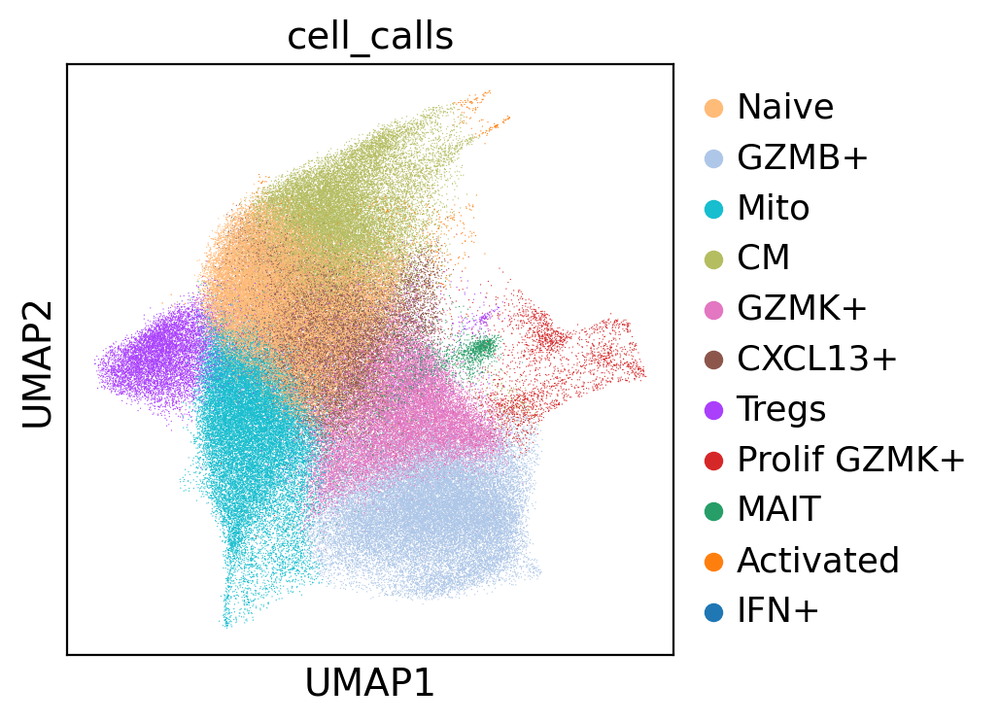

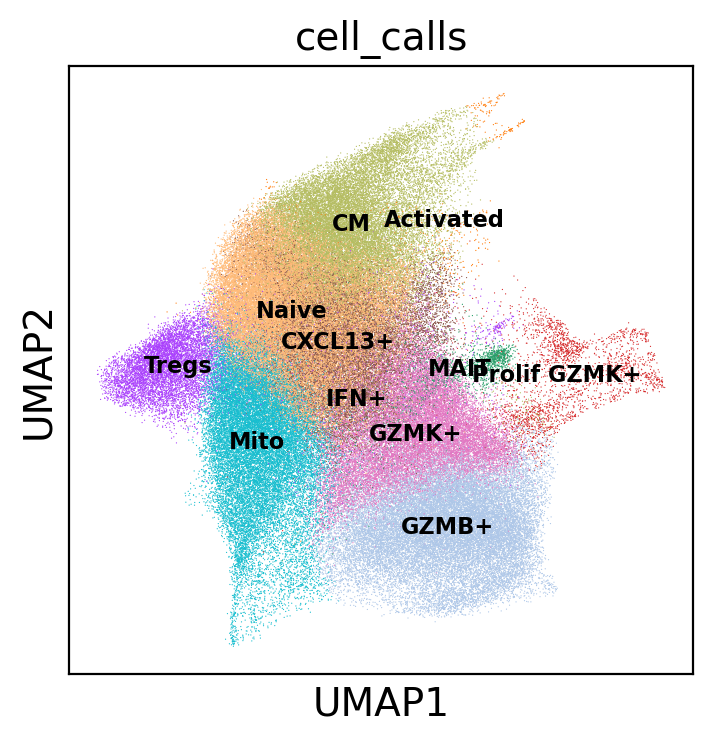

In [118]:
umap_colors = ['#ffbb78',
 '#aec7e8',
 '#17becf',
 '#b5bd61',
 '#e377c2',
 '#8c564b',
 '#aa40fc',
 '#d62728',
 '#279e68',
 '#ff7f0e',
 '#1f77b4']

umap_order = ['Naive','GZMB+','Mito','CM','GZMK+',
             'CXCL13+','Tregs','Prolif GZMK+',
             'MAIT','Activated','IFN+']
umap_dict = dict(zip(umap_order,umap_colors))

sc.pl.umap(adata, color = "cell_calls", palette = umap_colors , save = "_cellcalls.pdf")
sc.pl.umap(adata, color = ['cell_calls'], legend_loc = 'on data', legend_fontsize = 'xx-small',
          palette = umap_colors, save = '_cellcalls_on_data.pdf')

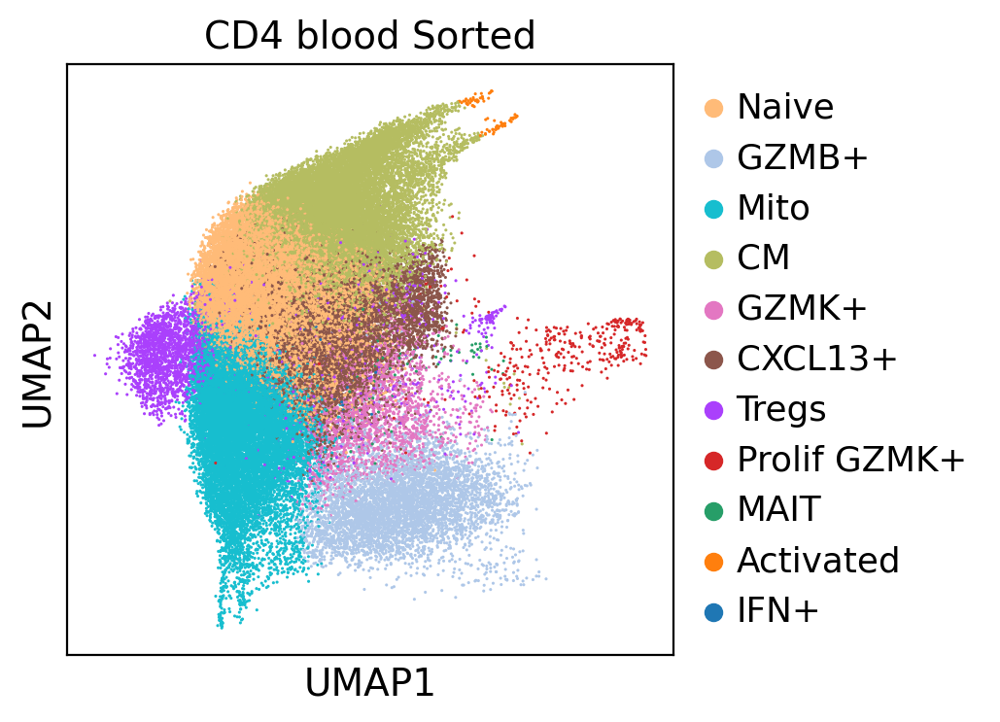

In [119]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], vmax = 6,
                color = ['cell_calls'], title = "CD4 blood Sorted", size = 5,
                save = '_CD4_blood_cellcalls_on_data.pdf')

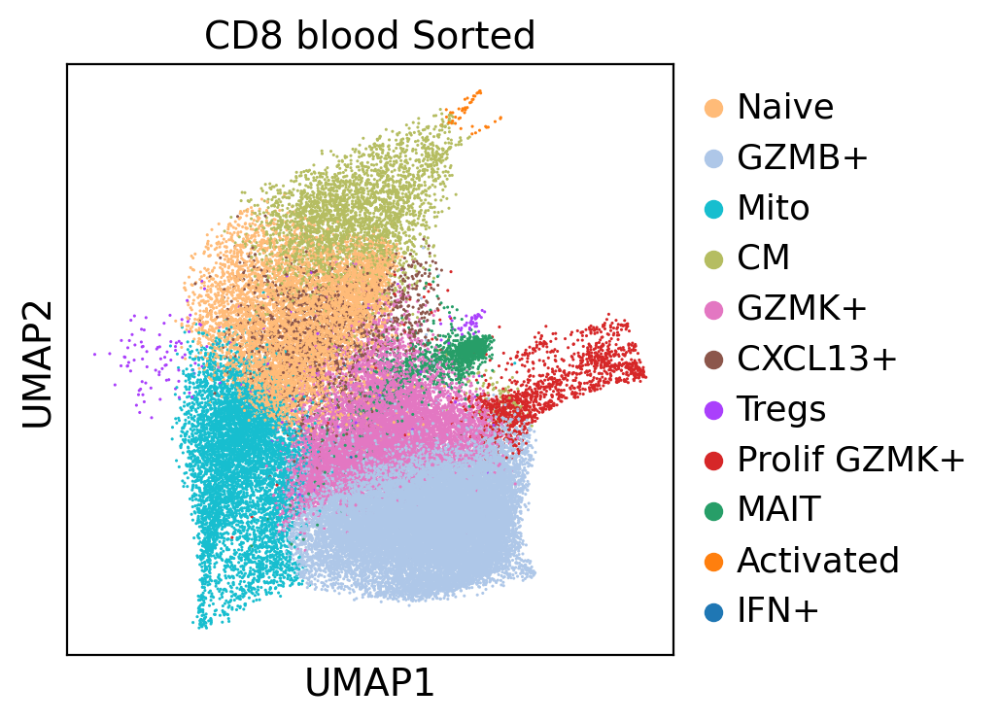

In [120]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], vmax = 6,
                color = ['cell_calls'], title = "CD8 blood Sorted", size = 5,
                save = '_CD8_blood_cellcalls_on_data.pdf')

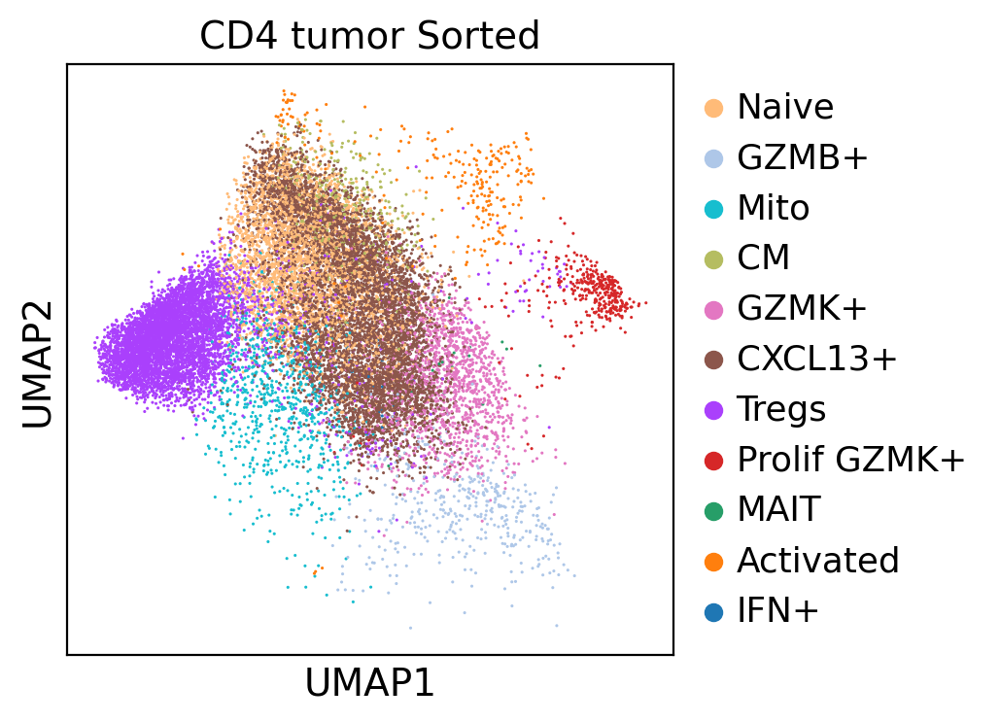

In [121]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], vmax = 6,
                color = ['cell_calls'], title = "CD4 tumor Sorted", size = 5,
                save = '_CD4_tumor_cellcalls_on_data.pdf')

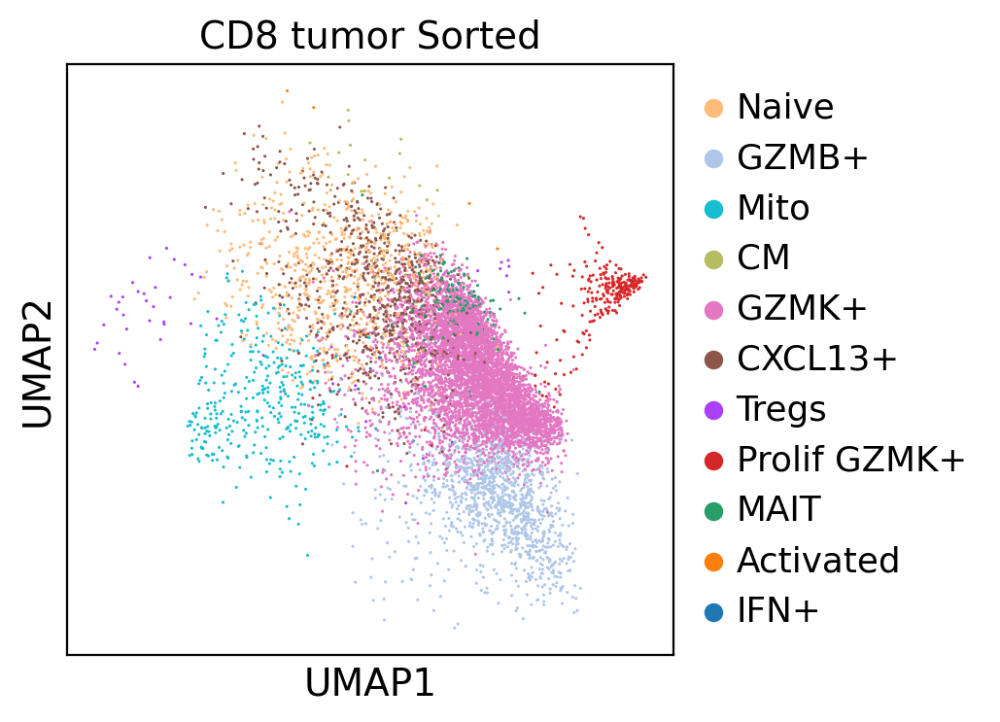

In [122]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], vmax = 6,
                color = ['cell_calls'], title = "CD8 tumor Sorted", size = 5,
                save = '_CD8_tumor_cellcalls_on_data.pdf')

# UMAP color on GZMB

In [7]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

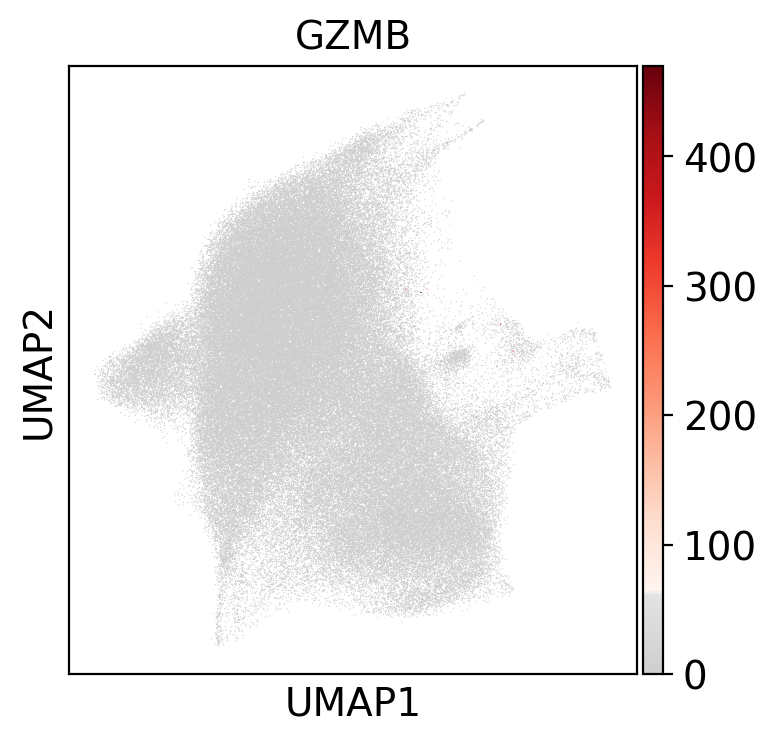

In [124]:
sc.pl.umap(adata, color = "GZMB", save = "_GZMB.pdf",  color_map=mymap)
# sc.pl.umap(adata, color = ['GZMB'], legend_loc = 'on data', legend_fontsize = 'xx-small',
#           palette = umap_colors, save = '_GZMB_on_data.pdf',  color_map=mymap)

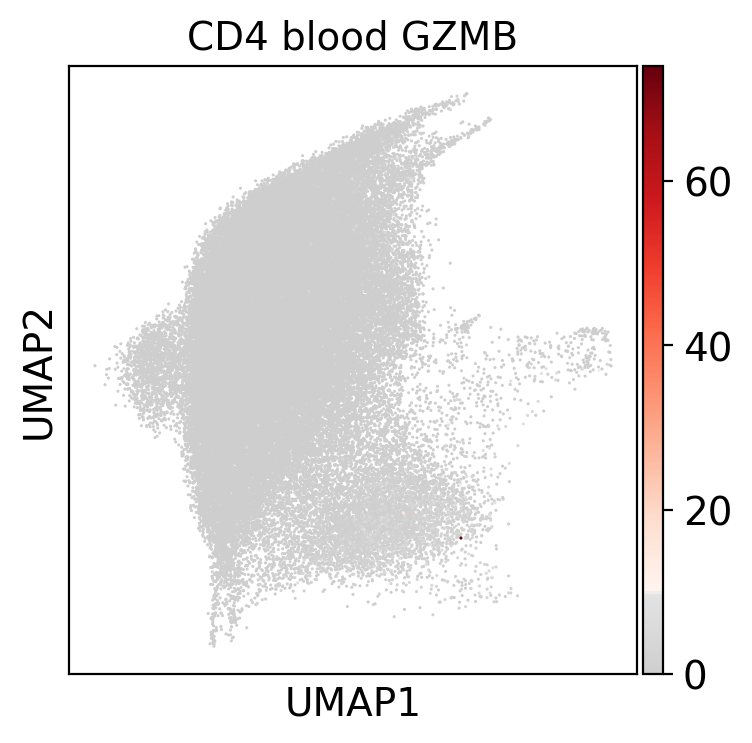

In [125]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['GZMB'], title = "CD4 blood GZMB", size = 5,
                save = '_CD4_blood_GZMB_raw_count.pdf', color_map=mymap, use_raw=True)

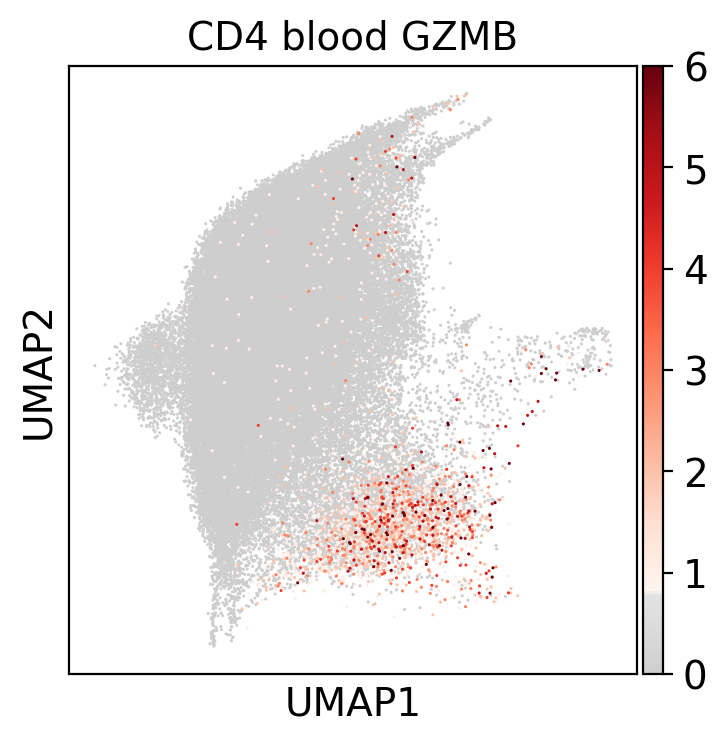

In [126]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['GZMB'], title = "CD4 blood GZMB", size = 5,
                save = '_CD4_blood_GZMB_vmax6.pdf', color_map=mymap, use_raw=True)

In [127]:
adata_GZMB = adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))][:, ['GZMB']]
GZMB_info = pd.DataFrame(adata_GZMB[:, ['GZMB']].layers["counts"].toarray())
GZMB_info.iloc[:, 0].value_counts()

0.0     71491
1.0      1322
2.0       569
3.0       240
4.0       112
5.0        68
6.0        28
7.0        14
8.0        10
9.0         6
10.0        4
13.0        1
11.0        1
74.0        1
16.0        1
12.0        1
Name: 0, dtype: int64

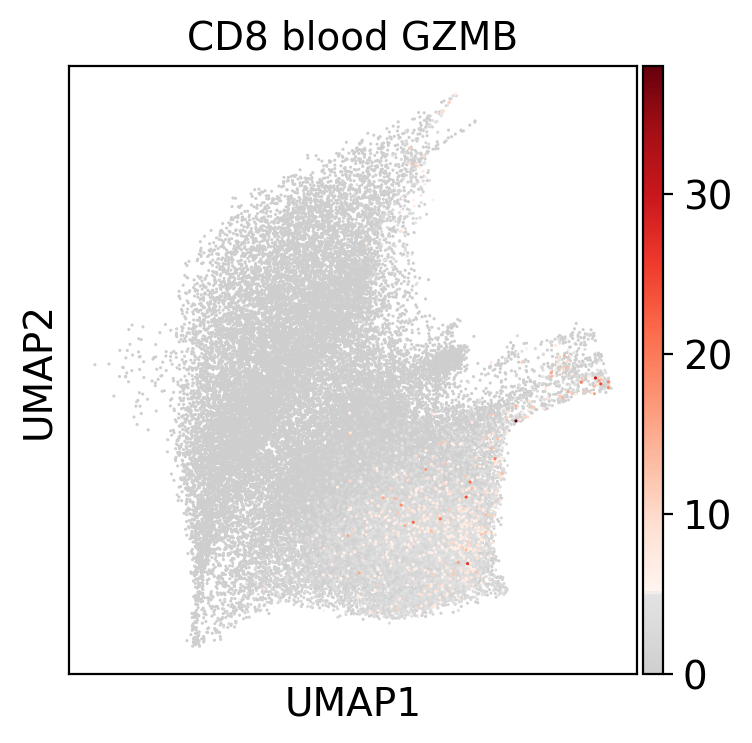

In [128]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['GZMB'], title = "CD8 blood GZMB", size = 5,
                save = '_CD8_blood_GZMB_raw_count.pdf', color_map=mymap)

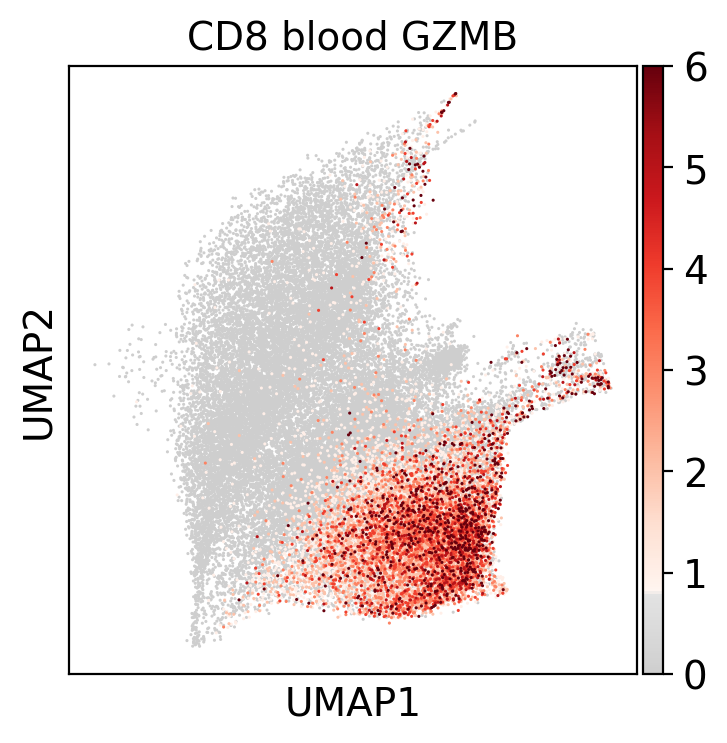

In [129]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], vmax = 6,
                color = ['GZMB'], title = "CD8 blood GZMB", size = 5,
                save = '_CD8_blood_GZMB_vmax6.pdf', color_map=mymap)

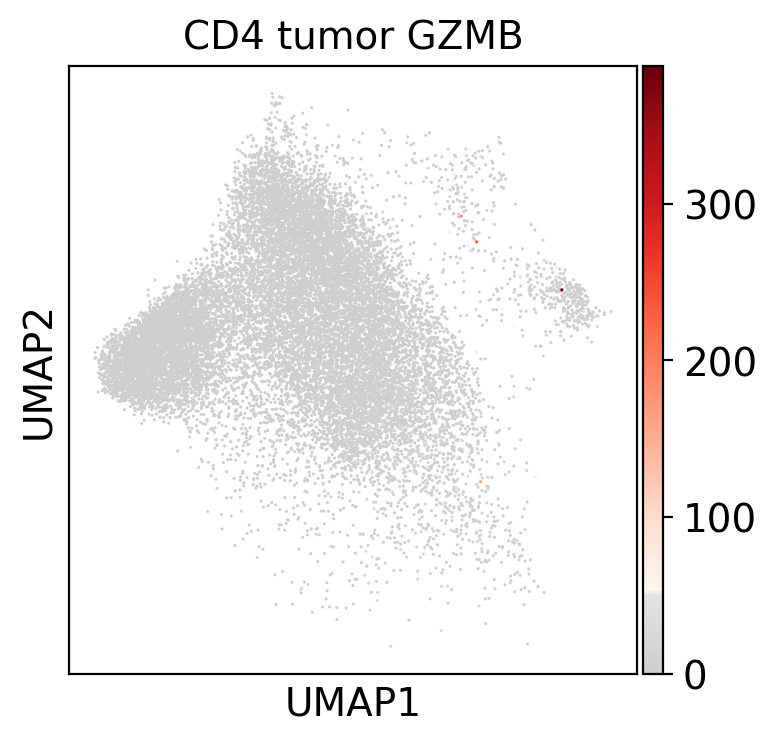

In [130]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['GZMB'], title = "CD4 tumor GZMB", size = 5,
                save = '_CD4_tumor_GZMB_raw_count.pdf', color_map=mymap)

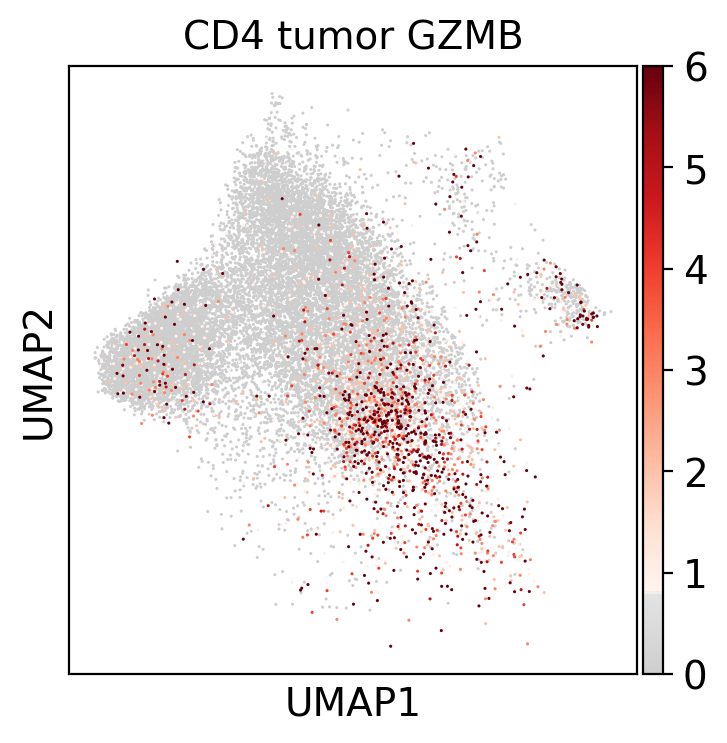

In [131]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], vmax = 6,
                color = ['GZMB'], title = "CD4 tumor GZMB", size = 5,
                save = '_CD4_tumor_GZMB_vmax6.pdf', color_map=mymap)

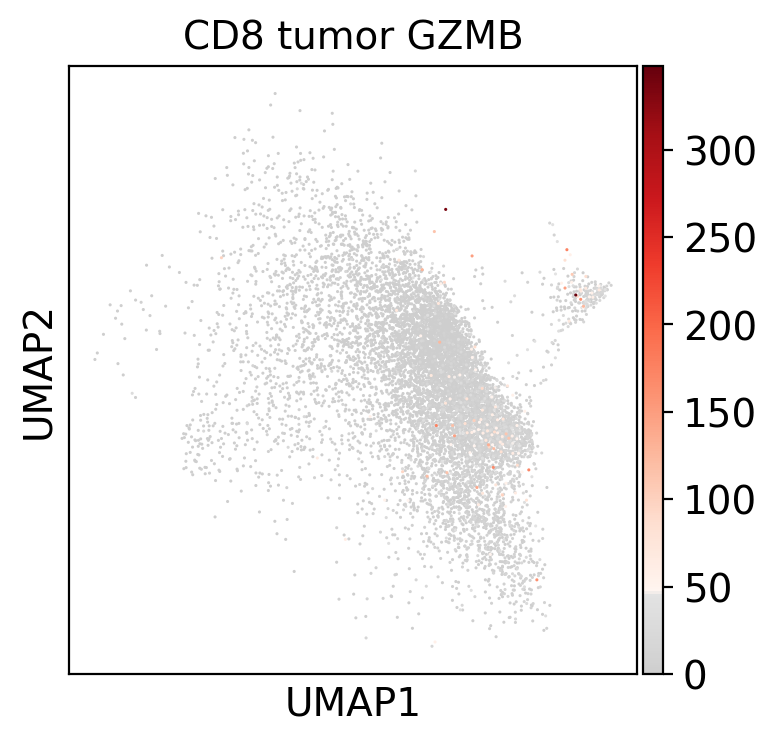

In [132]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['GZMB'], title = "CD8 tumor GZMB", size = 5,
                save = '_CD8_tumor_GZMB_raw_count.pdf', color_map=mymap)

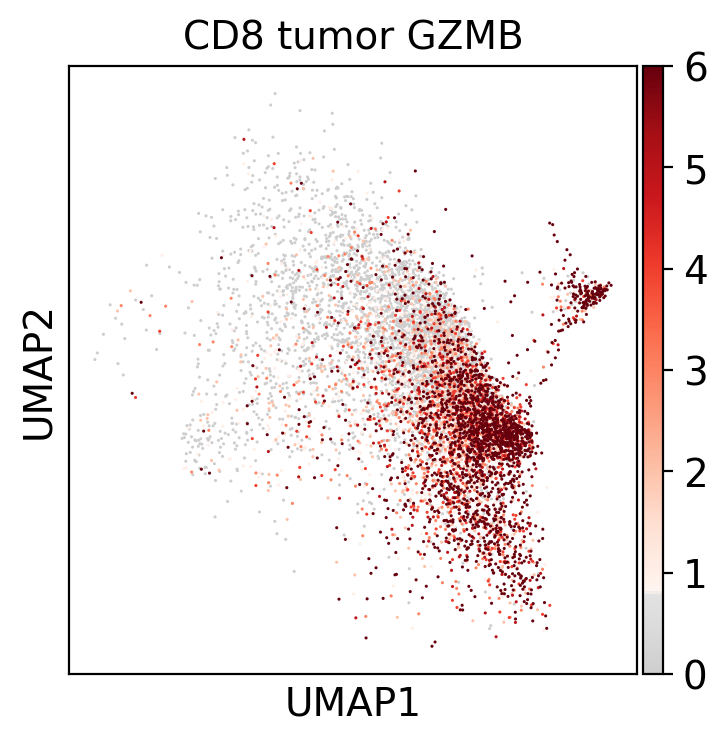

In [133]:
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['GZMB'], title = "CD8 tumor GZMB", size = 5,
                save = '_CD8_tumor_GZMB_vmax6.pdf', color_map=mymap)

# UMAP color on GZMK

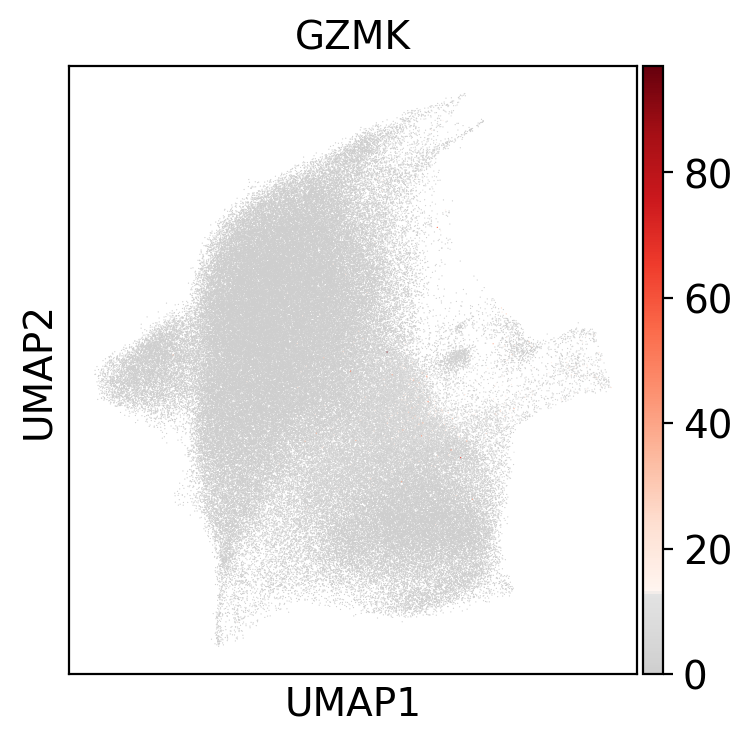

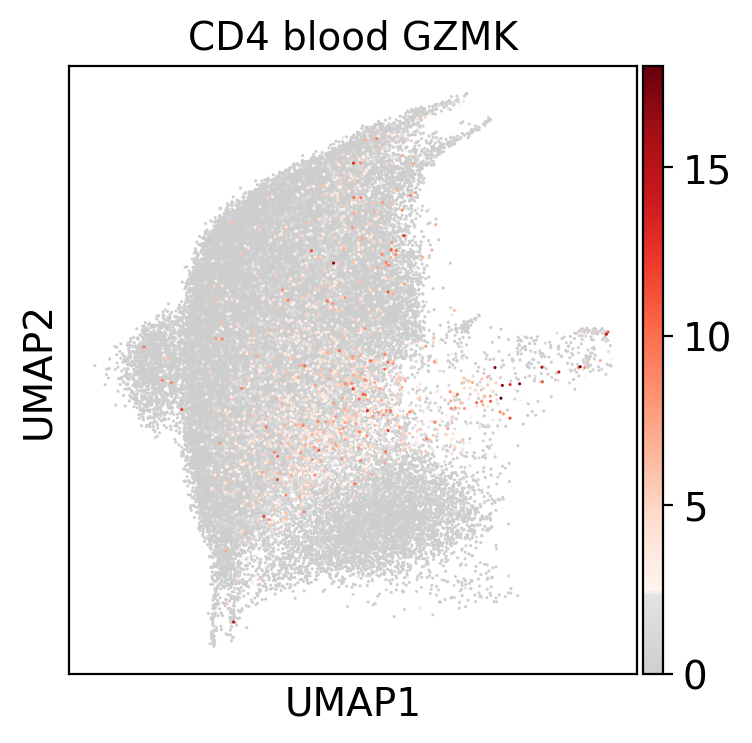

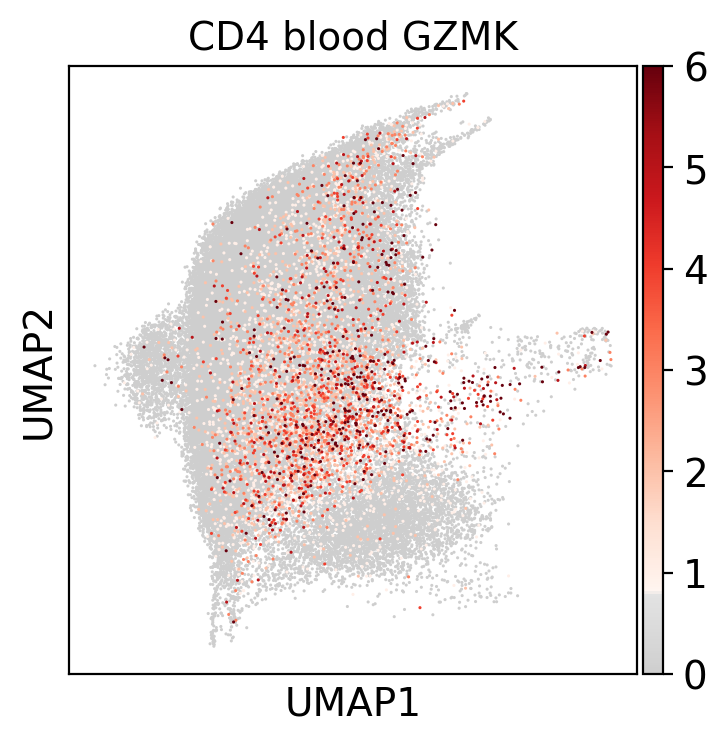

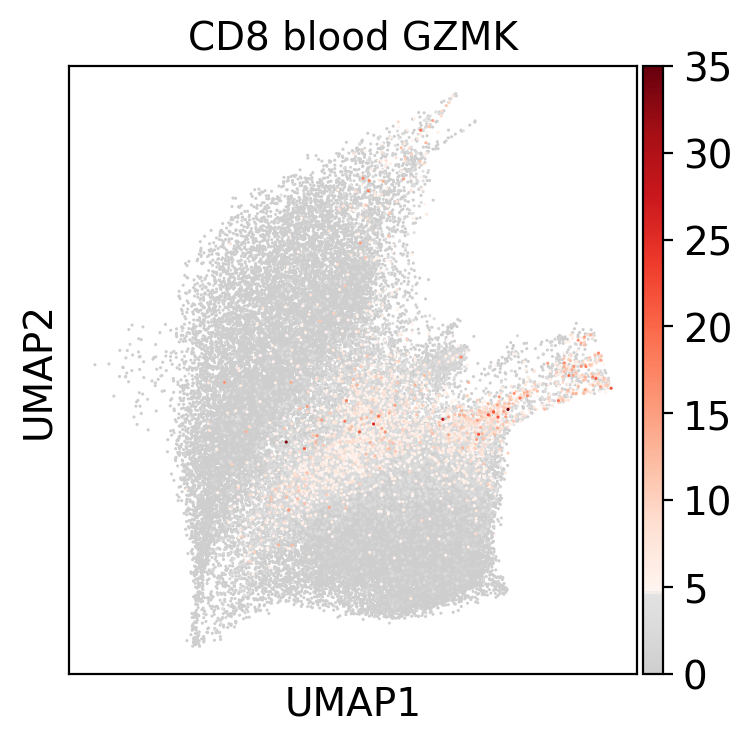

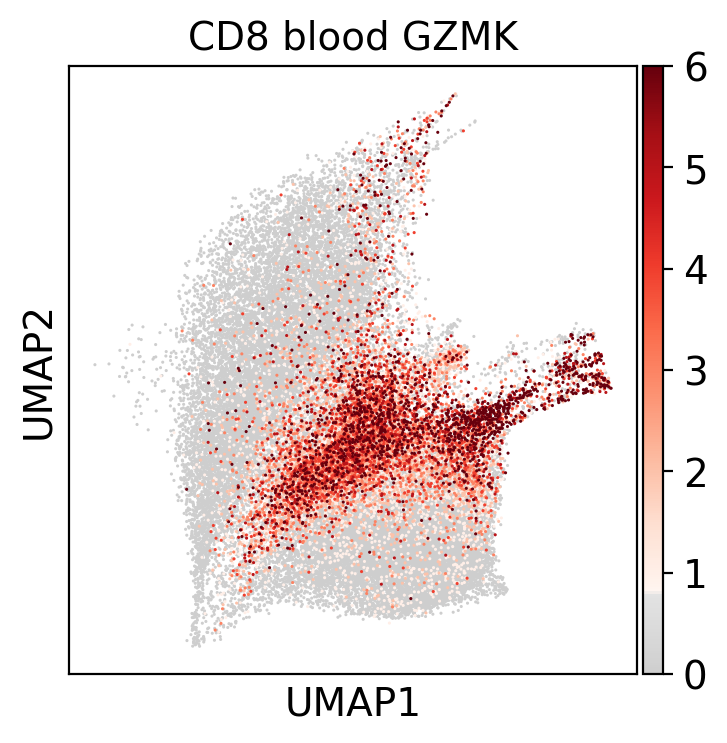

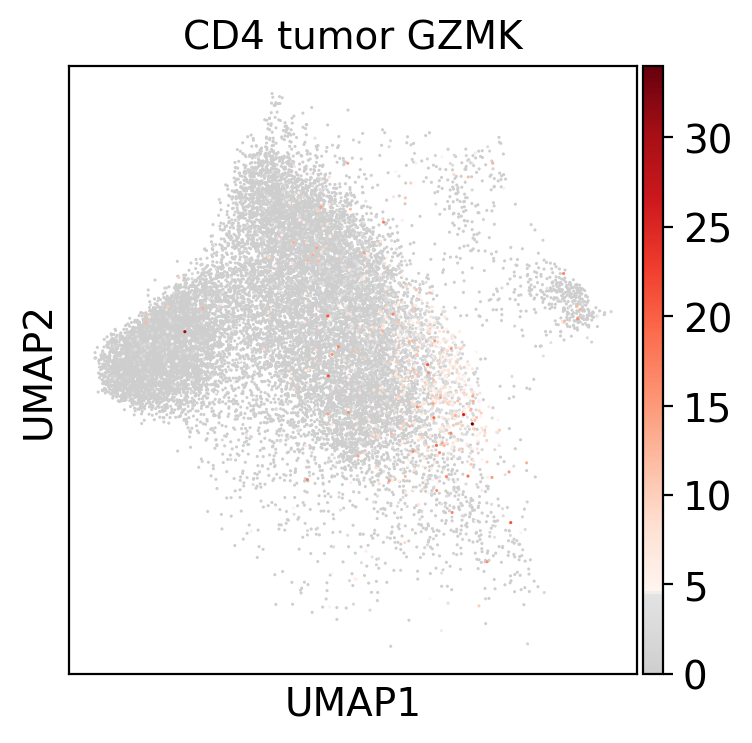

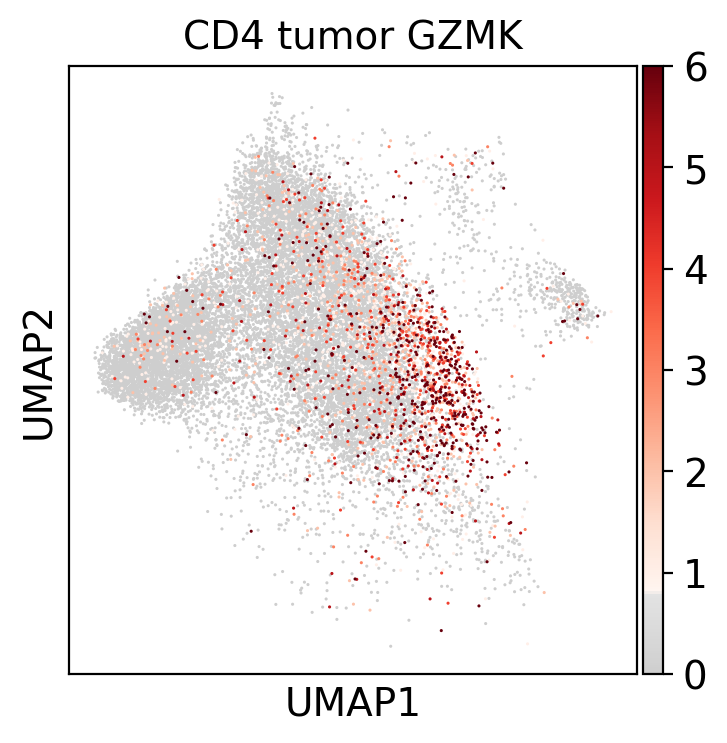

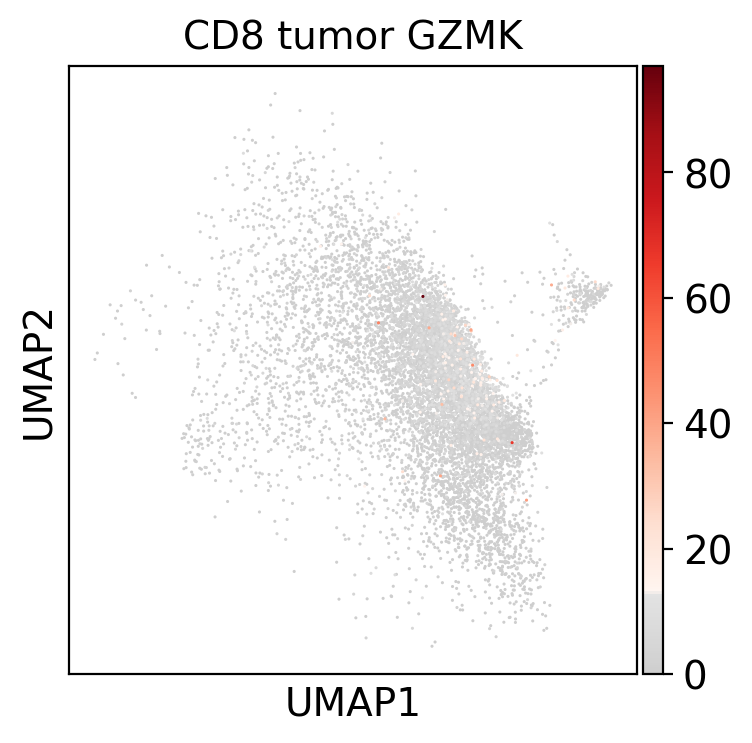

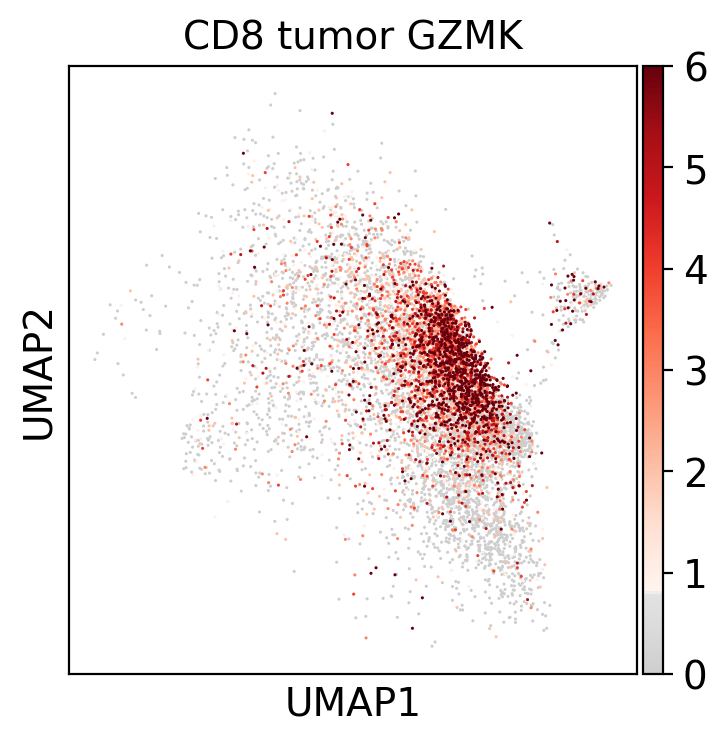

In [134]:
sc.pl.umap(adata, color = "GZMK", save = "_GZMK.pdf",  color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['GZMK'], title = "CD4 blood GZMK", size = 5,
                save = '_CD4_blood_GZMK_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['GZMK'], title = "CD4 blood GZMK", size = 5,
                save = '_CD4_blood_GZMK_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['GZMK'], title = "CD8 blood GZMK", size = 5,
                save = '_CD8_blood_GZMK_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['GZMK'], title = "CD8 blood GZMK", size = 5,
                save = '_CD8_blood_GZMK_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['GZMK'], title = "CD4 tumor GZMK", size = 5,
                save = '_CD4_tumor_GZMK_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['GZMK'], title = "CD4 tumor GZMK", size = 5,
                save = '_CD4_tumor_GZMK_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['GZMK'], title = "CD8 tumor GZMK", size = 5,
                save = '_CD8_tumor_GZMK_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['GZMK'], title = "CD8 tumor GZMK", size = 5,
                save = '_CD8_tumor_GZMK_vmax6.pdf', color_map=mymap)

# UMAP color on PRF1

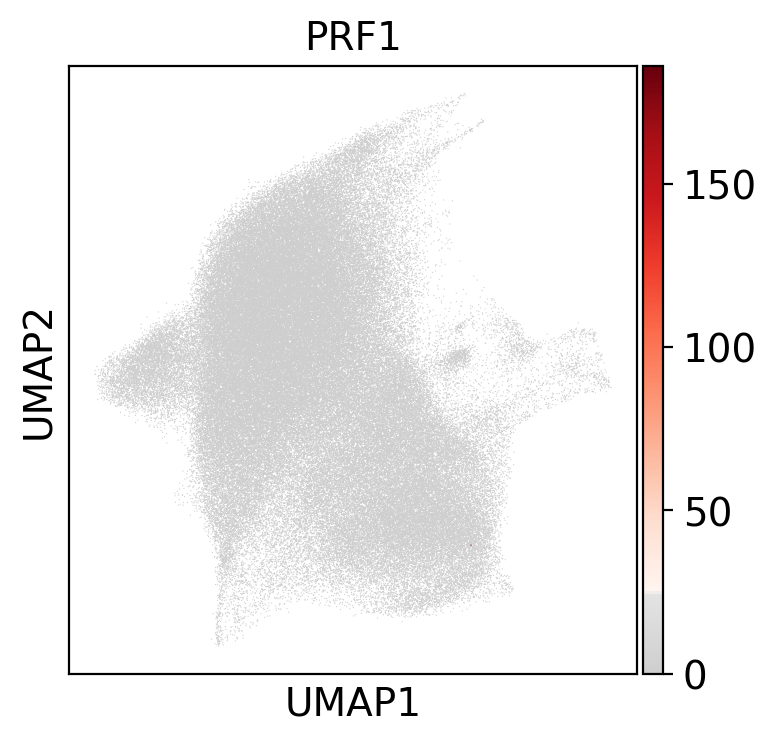

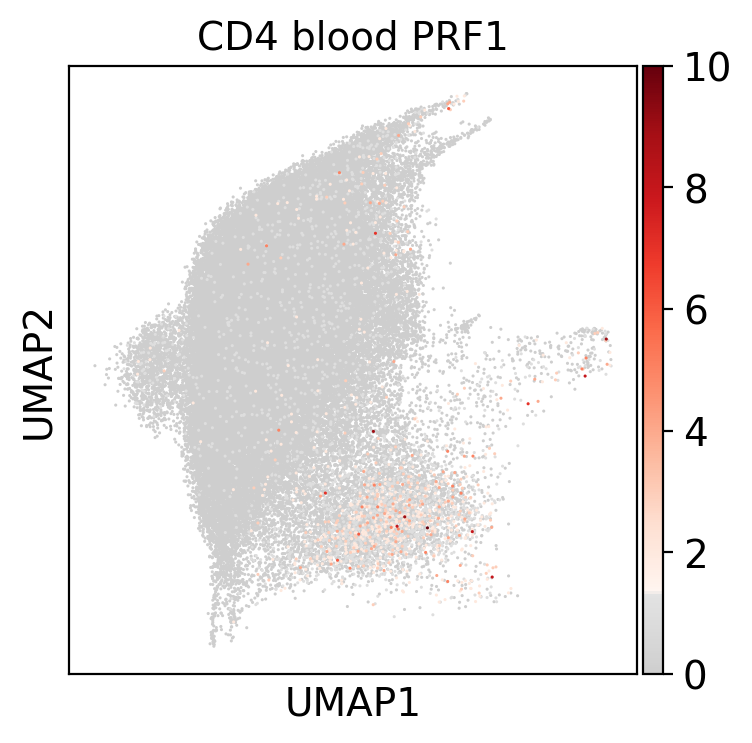

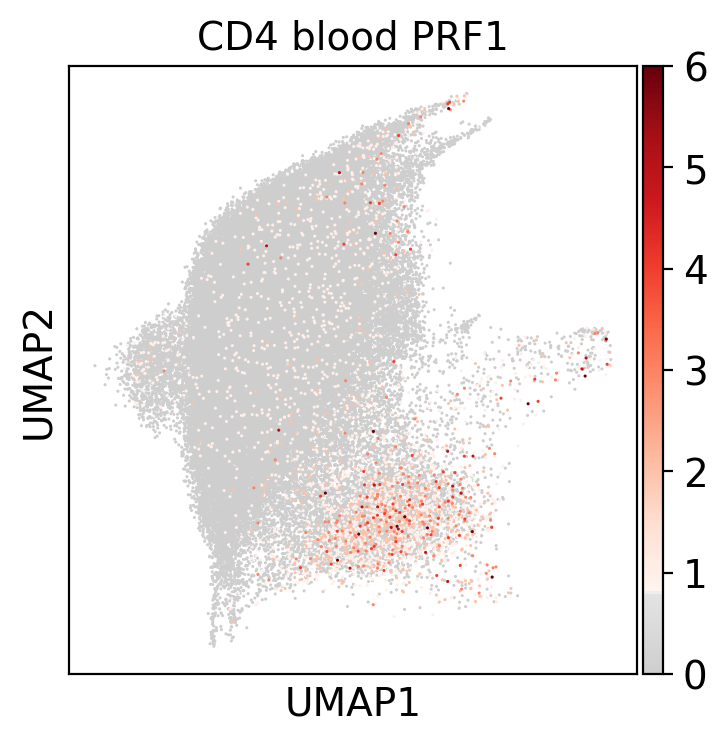

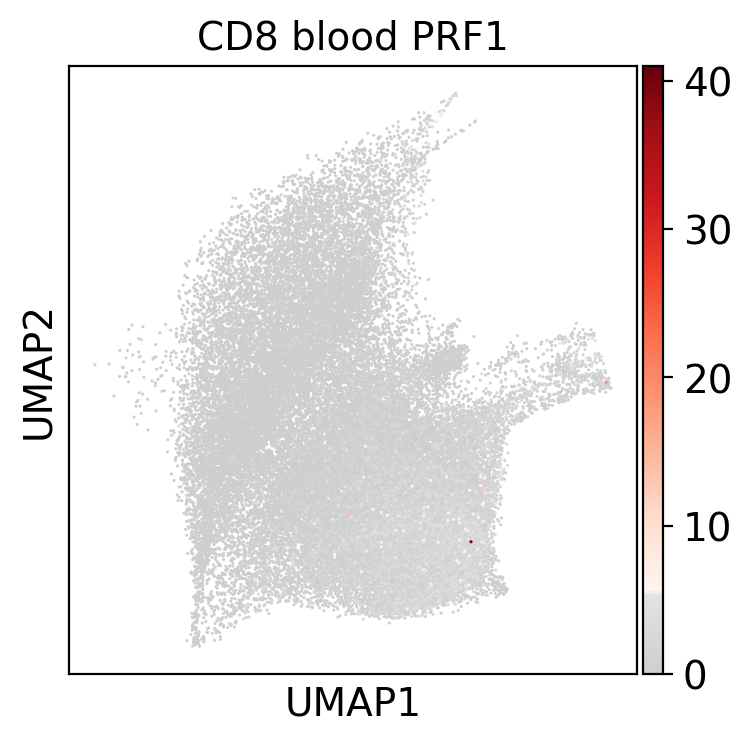

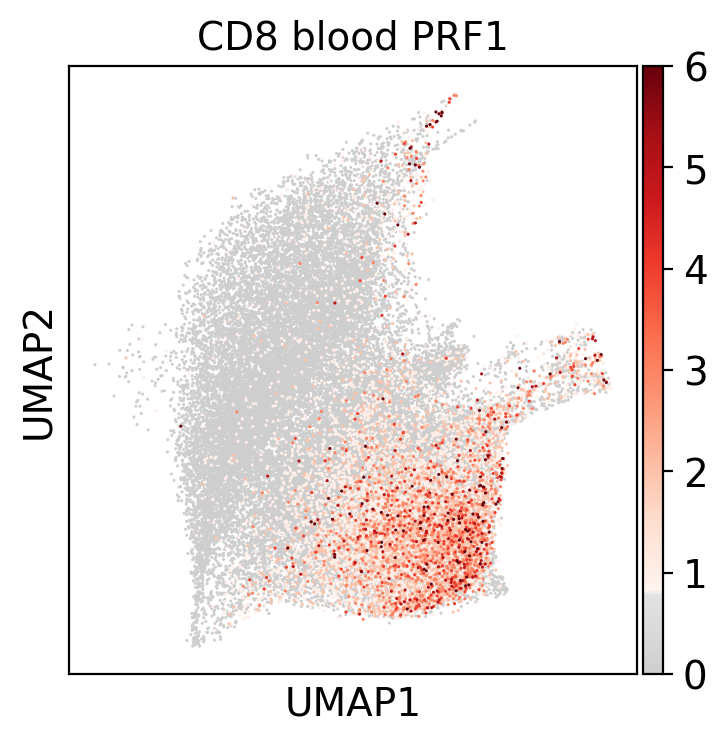

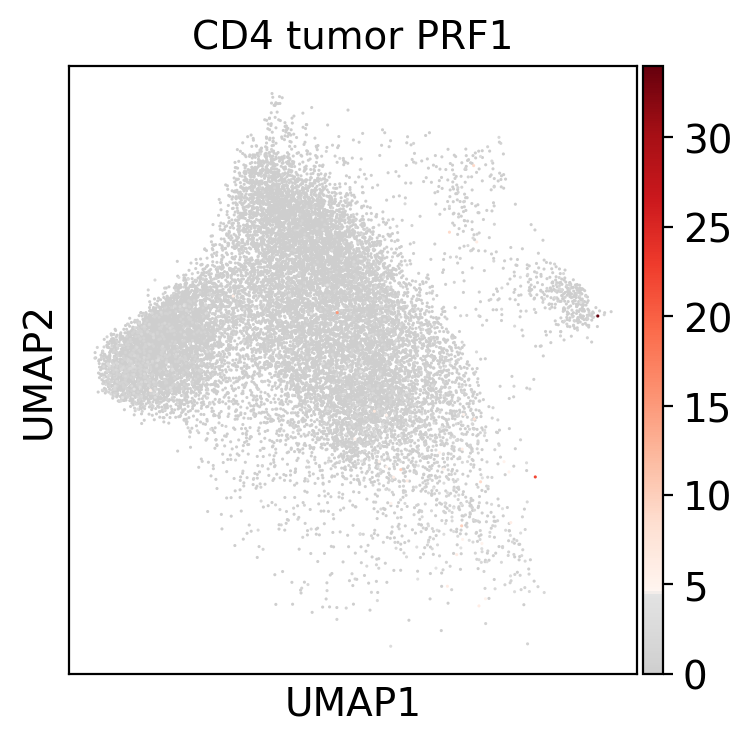

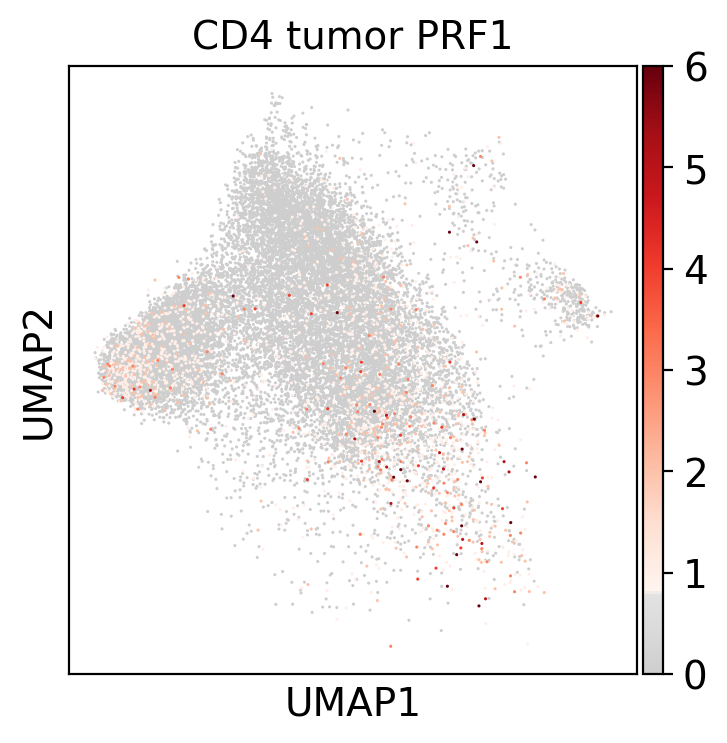

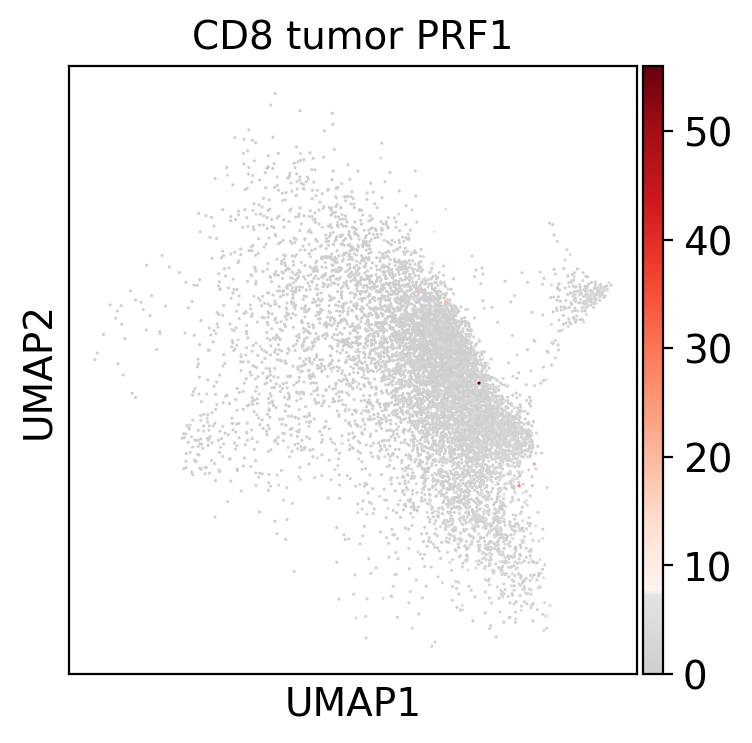

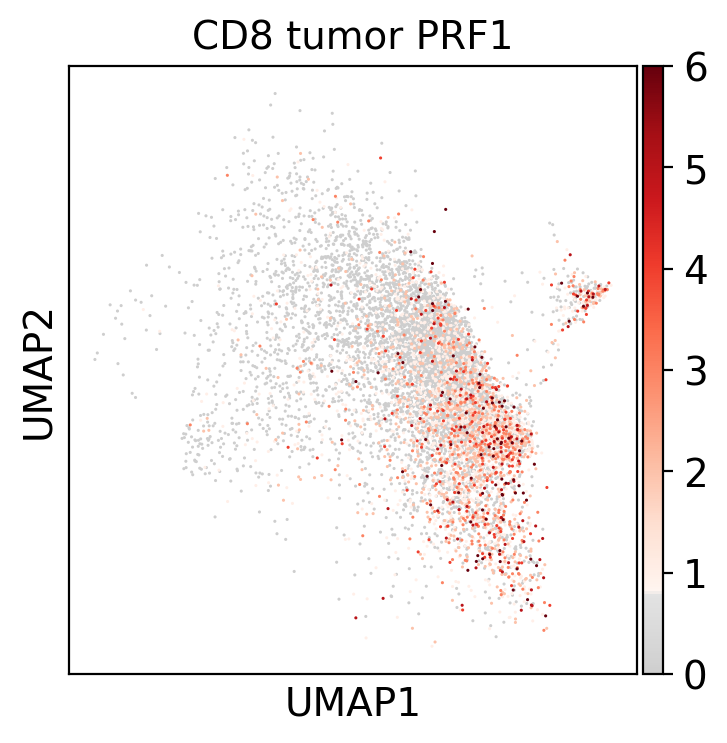

In [135]:
sc.pl.umap(adata, color = "PRF1", save = "_PRF1.pdf",  color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['PRF1'], title = "CD4 blood PRF1", size = 5,
                save = '_CD4_blood_PRF1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['PRF1'], title = "CD4 blood PRF1", size = 5,
                save = '_CD4_blood_PRF1_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
#            vmax = 6,
                color = ['PRF1'], title = "CD8 blood PRF1", size = 5,
                save = '_CD8_blood_PRF1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['PRF1'], title = "CD8 blood PRF1", size = 5,
                save = '_CD8_blood_PRF1_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['PRF1'], title = "CD4 tumor PRF1", size = 5,
                save = '_CD4_tumor_PRF1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['PRF1'], title = "CD4 tumor PRF1", size = 5,
                save = '_CD4_tumor_PRF1_vmax6.pdf', color_map=mymap)

sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
#            vmax = 6,
                color = ['PRF1'], title = "CD8 tumor PRF1", size = 5,
                save = '_CD8_tumor_PRF1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['PRF1'], title = "CD8 tumor PRF1", size = 5,
                save = '_CD8_tumor_PRF1_vmax6.pdf', color_map=mymap)

In [26]:
# select_genes = ['MKI67','KLRG1']
select_genes = ['MKI67','KLRG1','GZMB','GZMK'] # not 
select_genes_index = adata_raw.var.index.isin(select_genes)
gene_counts = pd.DataFrame(adata_raw.X[:,select_genes_index].todense())
gene_counts.columns = select_genes
gene_counts

,MKI67,KLRG1,GZMB,GZMK
0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,3.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
157049,0.0,0.0,0.0,0.0
157050,0.0,0.0,1.0,12.0
157051,2.0,0.0,0.0,0.0
157052,0.0,0.0,0.0,0.0


In [29]:
adata_raw.obsm['X_umap'] = adata.obsm['X_umap']
# adata_raw.uns['umap'] = adata.uns['umap']

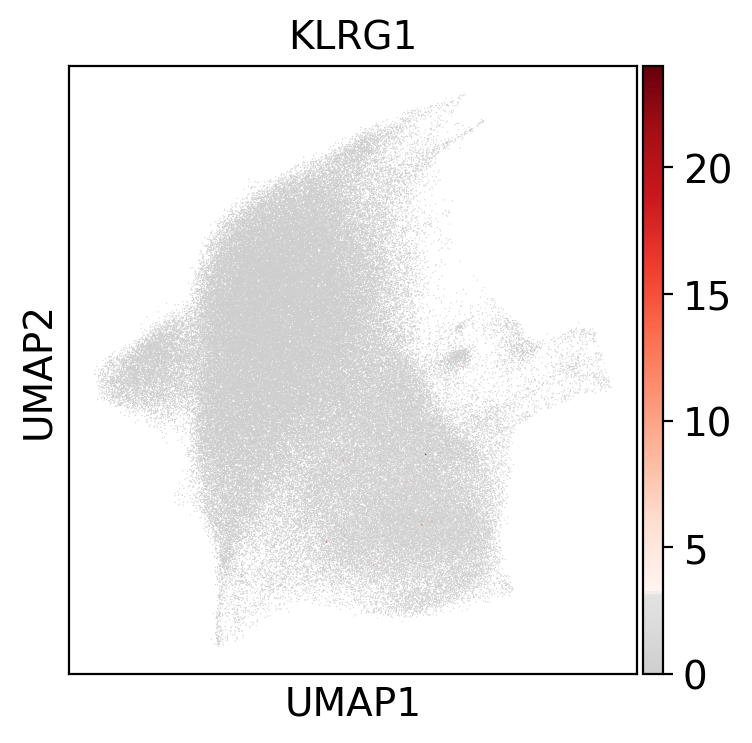

In [30]:
sc.pl.umap(adata_raw, color = "KLRG1",   color_map=mymap)

# UMAP color on KLRG1

KeyError: 'KLRG1'

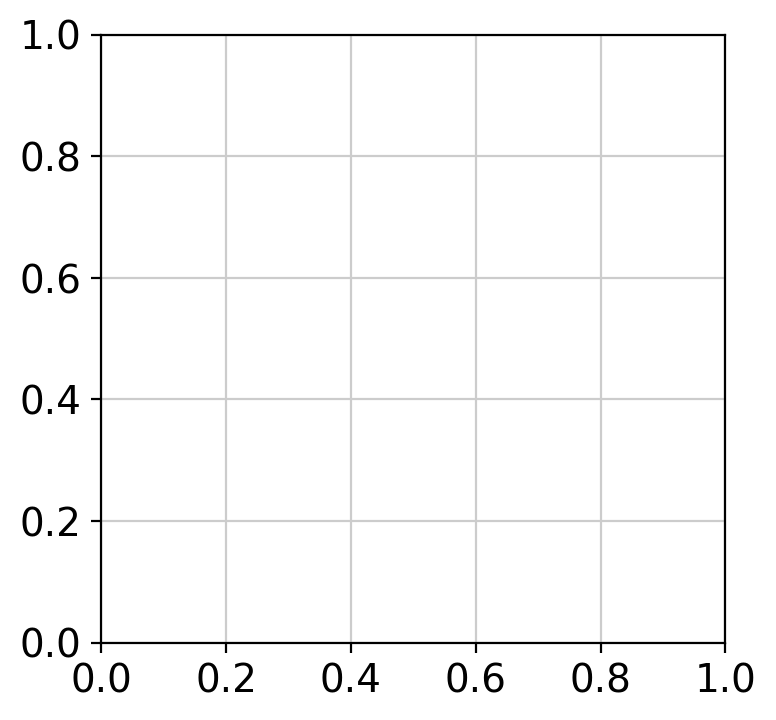

In [16]:
# sc.pl.umap(adata, color = "KLRG1", save = "_KLRG1.pdf",  color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['KLRG1'], title = "CD4 blood KLRG1", size = 5,
#                 save = '_CD4_blood_KLRG1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['KLRG1'], title = "CD4 blood KLRG1", size = 5,
                save = '_CD4_blood_KLRG1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['KLRG1'], title = "CD8 blood KLRG1", size = 5,
#                 save = '_CD8_blood_KLRG1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['KLRG1'], title = "CD8 blood KLRG1", size = 5,
                save = '_CD8_blood_KLRG1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['KLRG1'], title = "CD4 tumor KLRG1", size = 5,
#                 save = '_CD4_tumor_KLRG1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['KLRG1'], title = "CD4 tumor KLRG1", size = 5,
                save = '_CD4_tumor_KLRG1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['KLRG1'], title = "CD8 tumor KLRG1", size = 5,
#                 save = '_CD8_tumor_KLRG1_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['KLRG1'], title = "CD8 tumor KLRG1", size = 5,
                save = '_CD8_tumor_KLRG1_vmax6.pdf', color_map=mymap)

# UMAP color on MKI67

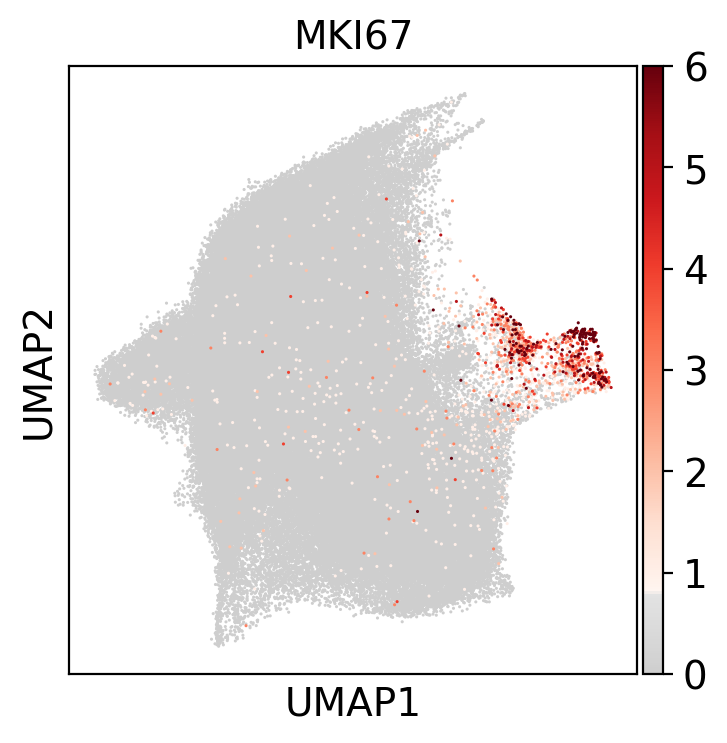

In [22]:
sc.pl.umap(adata, color = "MKI67",   color_map=mymap, vmax = 6,size = 5)

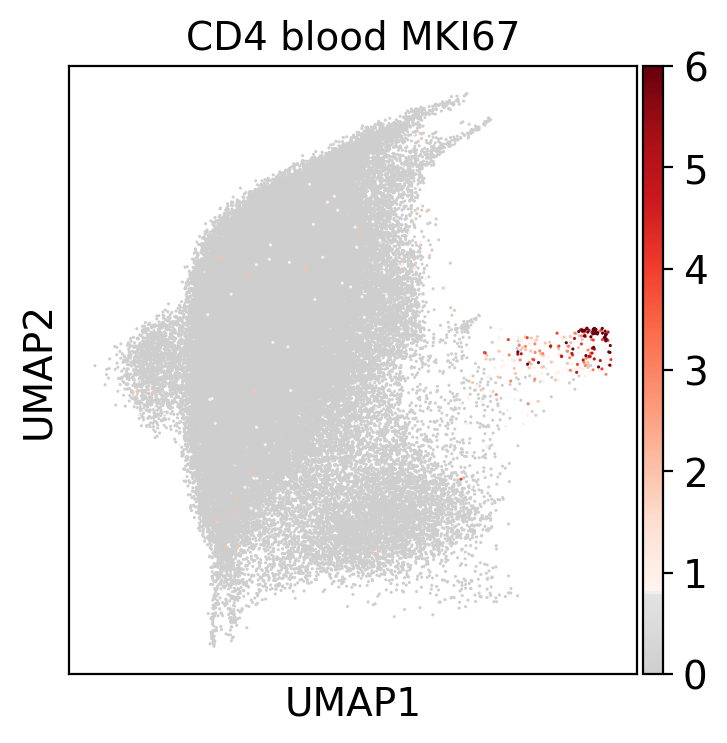

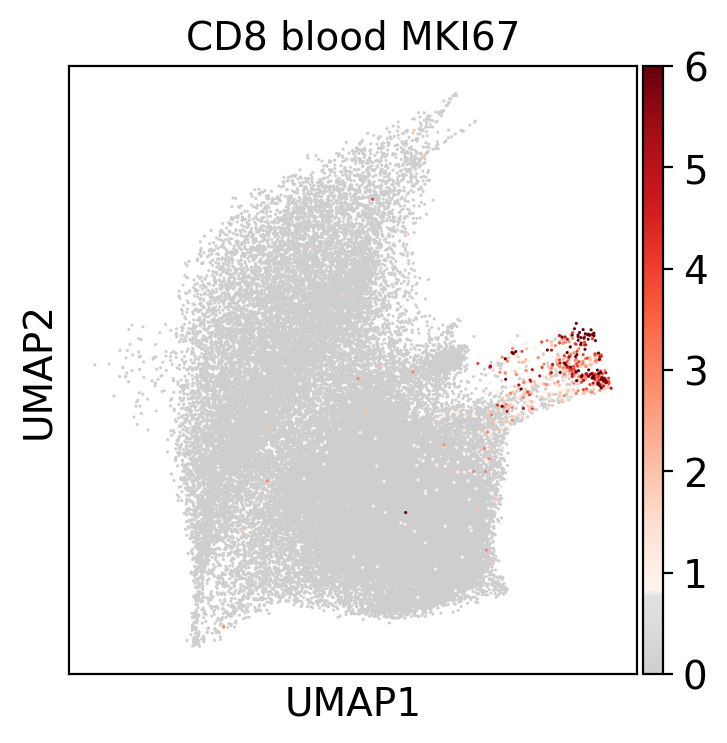

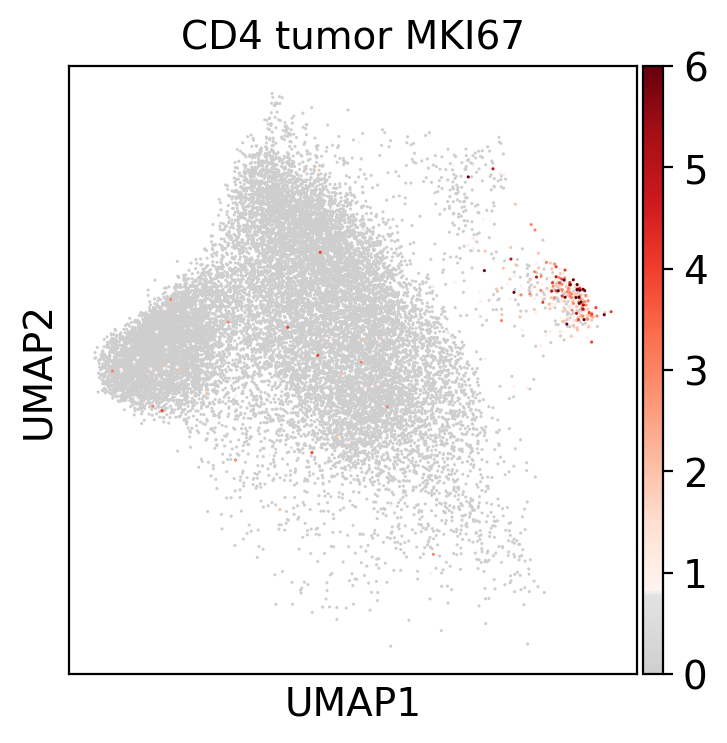

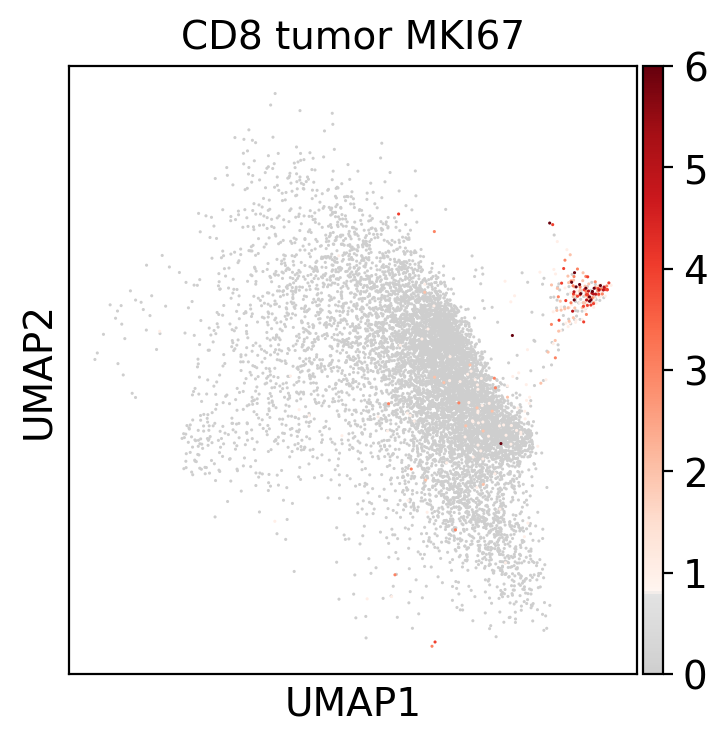

In [21]:
# sc.pl.umap(adata, color = "MKI67", save = "_MKI67.pdf",  color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 blood MKI67", size = 5,
#                 save = '_CD4_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['MKI67'], title = "CD4 blood MKI67", size = 5,
                save = '_CD4_blood_MKI67_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 blood MKI67", size = 5,
#                 save = '_CD8_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['MKI67'], title = "CD8 blood MKI67", size = 5,
                save = '_CD8_blood_MKI67_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 tumor MKI67", size = 5,
#                 save = '_CD4_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['MKI67'], title = "CD4 tumor MKI67", size = 5,
                save = '_CD4_tumor_MKI67_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 tumor MKI67", size = 5,
#                 save = '_CD8_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['MKI67'], title = "CD8 tumor MKI67", size = 5,
                save = '_CD8_tumor_MKI67_vmax6.pdf', color_map=mymap)

In [ ]:
# ENTPD1

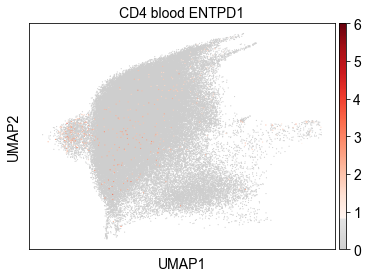

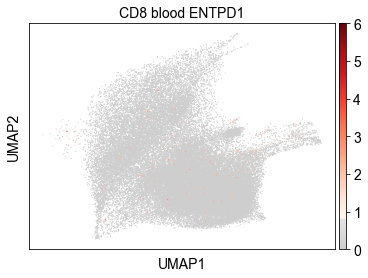

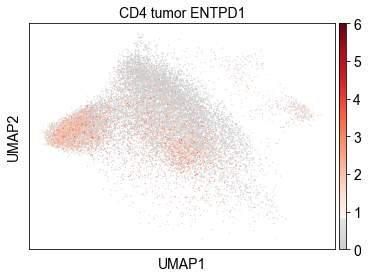

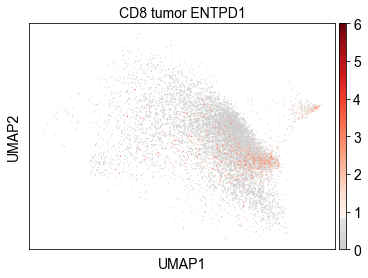

In [9]:
# sc.pl.umap(adata, color = "MKI67", save = "_MKI67.pdf",  color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 blood MKI67", size = 5,
#                 save = '_CD4_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['ENTPD1'], title = "CD4 blood ENTPD1", size = 5,
                save = '_CD4_blood_ENTPD1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 blood MKI67", size = 5,
#                 save = '_CD8_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['ENTPD1'], title = "CD8 blood ENTPD1", size = 5,
                save = '_CD8_blood_ENTPD1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 tumor MKI67", size = 5,
#                 save = '_CD4_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['ENTPD1'], title = "CD4 tumor ENTPD1", size = 5,
                save = '_CD4_tumor_ENTPD1_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 tumor MKI67", size = 5,
#                 save = '_CD8_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['ENTPD1'], title = "CD8 tumor ENTPD1", size = 5,
                save = '_CD8_tumor_ENTPD1_vmax6.pdf', color_map=mymap)

In [ ]:
# ITGAE

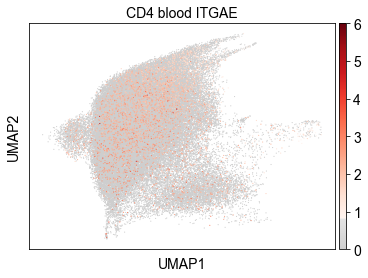

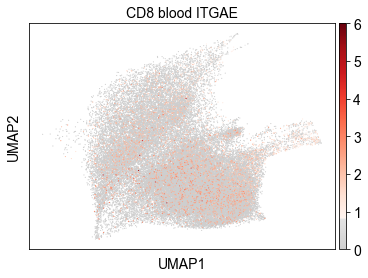

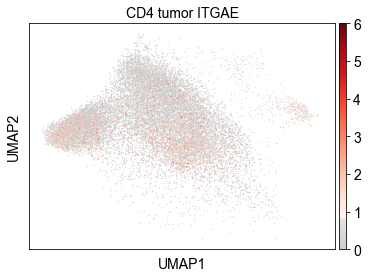

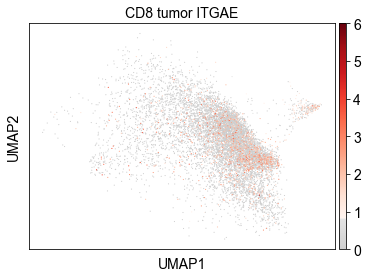

In [10]:
# sc.pl.umap(adata, color = "MKI67", save = "_MKI67.pdf",  color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 blood MKI67", size = 5,
#                 save = '_CD4_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['ITGAE'], title = "CD4 blood ITGAE", size = 5,
                save = '_CD4_blood_ITGAE_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 blood MKI67", size = 5,
#                 save = '_CD8_blood_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "blood"))], 
           vmax = 6,
                color = ['ITGAE'], title = "CD8 blood ITGAE", size = 5,
                save = '_CD8_blood_ITGAE_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD4 tumor MKI67", size = 5,
#                 save = '_CD4_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD4") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['ITGAE'], title = "CD4 tumor ITGAE", size = 5,
                save = '_CD4_tumor_ITGAE_vmax6.pdf', color_map=mymap)

# sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
# #            vmax = 6,
#                 color = ['MKI67'], title = "CD8 tumor MKI67", size = 5,
#                 save = '_CD8_tumor_MKI67_raw_count.pdf', color_map=mymap)
sc.pl.umap(adata[(adata.obs['comp'] == "CD8") & ((adata.obs['tissue'] == "tumor"))], 
           vmax = 6,
                color = ['ITGAE'], title = "CD8 tumor ITGAE", size = 5,
                save = '_CD8_tumor_ITGAE_vmax6.pdf', color_map=mymap)